In [2]:
#数据准备
import numpy as np
import xarray as xr
import netCDF4 as nc
import pandas as pd
import math
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.ticker as cticker
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from metpy import units
from netCDF4 import Dataset
import metpy.constants as constants
import metpy.calc as mpcalc
import cartopy.io.shapereader as shpreader
from matplotlib.path import Path
from cartopy.mpl.patch import geos_to_path
from metpy.interpolate import inverse_distance_to_grid
from scipy.interpolate import griddata
from scipy.interpolate import Rbf
from scipy import stats
import scipy.ndimage as ndimage
from mpl_toolkits.basemap import Basemap
import time
from matplotlib.dates import DateFormatter
from matplotlib.colors import ListedColormap, BoundaryNorm
import cftime
import mpath
import matplotlib.path as mpath
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
import os
import glob
import dask.array as da
import cmaps
import import_ipynb
from cartopy.util import add_cyclic_point
from matplotlib import rcParams
import sys
sys.path.append(r'C:\zjh\Python\jupyterProject\jupyterProject')
import code_study as cs
from datetime import datetime as dt
from datetime import timedelta
from matplotlib.ticker import FixedLocator
# %run code_study.ipynb

In [3]:
def TM90(lonl,lonr,data0):
    delta=np.array([-5, 0, 5])
    data=data0.sel(lon=slice(lonl,lonr))
    TM90=xr.zeros_like(data.sel(lat=60))
    G_S_all=[]
    G_N_all=[]
    for dl in delta:
        phi_n=70+dl
        phi_o=57.5+dl
        phi_s=45+dl
        G_S=(data.sel(lat=phi_o)- data.sel(lat=phi_s).values) / (phi_o - phi_s)
        G_N=(data.sel(lat=phi_n)- data.sel(lat=phi_o).values) / (phi_n - phi_o)
        G_S_all.append(G_S)
        G_N_all.append(G_N)
        condition = (G_S > 0) & (G_N < -10)
        TM90 = TM90.where(~condition, 1) #保留condition为True的值，其他位置替换为1
    return TM90,G_S_all, G_N_all
# 乌拉尔地区：30-90°E 45-70°N.

In [4]:
def data_all(lat1,lat2,lon1,lon2,year,allyear,var):
 
    path=r'D:\data\Data_concat\\'+str(year)+'_'+var+'\\'+var+'_1979_'+str(year-1)+'03.nc'
    isExists=os.path.exists(path)
    if not isExists:
        os.mkdir(path)
        files=glob.glob('E://data//ERA5.daily.1x1//'+var+'//'+var+'.*.nc')[12*(year-1979-allyear)+3:12*(year-1979)+3]
        data_scatter=[]
        lon_c=np.arange(-360,360,1)
        for file in files:  #按照顺序在 files 里面进行每一个文件的 数据名称 循环读取
            f=xr.open_dataset(file)  # 打开第一个文件
            if var=='Z':
                if f.g0_lon_3[-1]>300:
                    data_c=np.tile(f[var].loc[:,500,:,:],(1,1,2))
                    data_dac=xr.DataArray(data_c,coords=[f.initial_time0_hours,f.g0_lat_2,lon_c],dims=['time','lat','lon'])
                    t0=data_dac.loc[:,lat1:lat2,lon1:lon2]/9.8
                else:
                    uf1c,lonc=add_cyclic_point(f[var].loc[:,500,:,:],coord=f.g0_lon_3, axis=-1)
                    data_dac=xr.DataArray(uf1c,coords=[f.initial_time0_hours,f.g0_lat_2,lonc],dims=['time','lat','lon'])
                    t0=data_dac.loc[:,lat1:lat2,lon1:lon2]/9.8
            else:
                if f.g0_lon_2[-1]>300:
                    data_c=np.tile(f[var],(1,1,2))
                    data_dac=xr.DataArray(data_c,coords=[f.initial_time0_hours,f.g0_lat_1,lon_c],dims=['time','lat','lon'])
                    t0=data_dac.loc[:,lat1:lat2,lon1:lon2]   
                else:
                    uf1c,lonc=add_cyclic_point(f[var],coord=f.g0_lon_2, axis=-1)
                    data_dac=xr.DataArray(uf1c,coords=[f.initial_time0_hours,f.g0_lat_1,lonc],dims=['time','lat','lon'])
                    t0=data_dac.loc[:,lat1:lat2,lon1:lon2]
            data_scatter.append(t0)
        t1=xr.concat(data_scatter,dim='time')
        mask=(t1.time.dt.month.isin([2])&t1.time.dt.day.isin([29]))
        t=t1.loc[~mask]
        if var=='Z':
            lat=t.lat.loc[lat1:lat2]
            lon=t.lon.loc[lon1:lon2]
        else:
            lat=t.lat.loc[lat1:lat2]
            lon=t.lon.loc[lon1:lon2]
        t_cli=t.values.reshape(allyear,365,len(lat),len(lon))
        time=pd.date_range('2010-04-01','2011-03-31',freq='D')
        t_cli_nc=xr.DataArray(t_cli,coords=[np.arange(1979,1979+allyear),time,lat,lon],dims=['year','time','lat','lon'],name=var+'_cli')
        t_cli_nc.to_netcdf(path+'\\'+var+'_1979_'+str(year-1)+'03.nc')
    elif var=='Z':
        t_cli_nc=xr.open_dataset(path+'\\'+var+'_1979_'+str(year-1)+'03.nc').Z_cli
    else:
        t_cli_nc=xr.open_dataset(path+'\\'+var+'_1979_'+str(year-1)+'03.nc').T2m_cli
    return t_cli_nc

In [5]:
data=data_all(0,90,-180,180,2025,46,'Z').interp(lat=np.arange(0,91,2.5),lon=np.arange(-180,181,2.5),method='linear')
data_cli=data.sel(year=slice(1979,2008))
data_cli_timean=data_cli.mean(dim='year')
data_cli_ano_all=data-data_cli_timean
data_cli_ano=data_cli_ano_all.sel(time=slice('2010-12-01','2011-02-28'))
TM90,G_S,G_N=TM90(30,90,data_cli_ano)
year=TM90.year

In [6]:
event=[]
for i in range(len(TM90.year)):
    yr= int(TM90.year[i].values)
    blocking_time= TM90[i].time.where(TM90[i].sum(dim='lon')>=1)
    blocking_time= pd.to_datetime(blocking_time).to_series().apply(lambda x: x.replace(year=yr if x.year==2010 else yr+1))
    blocking_lon_center=TM90[i].lon.where(TM90[i]==1).mean(dim='lon')
    event_time=[]
    for j in range(len(TM90.time)-5):
        if np.abs(blocking_lon_center[j+1]-blocking_lon_center[j]) < 30 and np.abs(blocking_lon_center[j+2]-blocking_lon_center[j+1]) < 30 and np.abs(blocking_lon_center[j+3]-blocking_lon_center[j+2]) < 30 and np.abs(blocking_lon_center[j+4]-blocking_lon_center[j+3]) < 30 and np.abs(blocking_lon_center[j+5]-blocking_lon_center[j+4]) < 30 and blocking_time[j] not in event_time:
            event_individual=[]
            event_time.append(blocking_time[j])
            event_individual.append(blocking_time[j])
            for k in range(len(TM90.time)-j-1):
                k=k+j+1
                if np.abs(blocking_lon_center[k]-blocking_lon_center[k-1]) < 30:
                    event_time.append(blocking_time[k])
                    event_individual.append(blocking_time[k])
                else:
                    break
            event.append(event_individual)

In [7]:
time_all=pd.date_range('1979-04-01','2025-03-31',freq='D')
time_all=time_all[~(time_all.month.isin([2])&time_all.day.isin([29]))]
time_all_summer=time_all[time_all.month.isin([12,1,2])]
Z500_ano=xr.DataArray(data_cli_ano.values.reshape(46*90,37,145),coords=[time_all_summer,data_cli_ano.lat,data_cli_ano.lon],dims=['time','lat','lon'],name='Z500_ano')
Z500_ano_all=xr.DataArray(data_cli_ano_all.values.reshape(46*365,37,145),coords=[time_all,data_cli_ano.lat,data_cli_ano.lon],dims=['time','lat','lon'],name='Z500_ano_all')
lon=np.arange(-60,120.1,2.5)
lat=data_cli_ano.lat
lat_ural=np.arange(45,70.1,2.5)
Z500_event_mean=[((Z500_ano.sel(time=ti,lat=slice(45,70),lon=slice(30,90)))*np.cos(np.radians(lat_ural[np.newaxis,:,np.newaxis]))/sum(np.cos(np.radians(lat_ural)))).sum(dim=['lat']).mean(dim=['lon']) for ti in event]
Z500_ano_mean=((Z500_ano.sel(lat=slice(45,70),lon=slice(-60,120)))*np.cos(np.radians(lat_ural[np.newaxis,:,np.newaxis]))/sum(np.cos(np.radians(lat_ural)))).sum(dim=['lat'])

In [8]:
for i in range(len(Z500_event_mean)-1,-1,-1):
    if max(Z500_event_mean[i])<0:
        Z500_event_mean.pop(i)
        event.pop(i)

In [9]:

Z500_event_time_center=[max(Z500_event_mean[i]).time for i in range(len(Z500_event_mean))]

Z500_event_center_mean=[(Z500_ano_all.sel(time=slice((pd.to_datetime(Z500_event_time_center[i].values)-timedelta(days=11)).strftime('%Y-%m-%d'), (pd.to_datetime(Z500_event_time_center[i].values)+timedelta(days=15)).strftime('%Y-%m-%d')),lat=slice(45,70),lon=slice(-30,90))*np.cos(np.radians(lat_ural[np.newaxis,:,np.newaxis]))/sum(np.cos(np.radians(lat_ural)))).sum(dim=['lat']) for i in range(len(Z500_event_time_center))]

Z500_event_center_mean_all=[(Z500_ano_all.sel(time=slice((pd.to_datetime(Z500_event_time_center[i].values)-timedelta(days=16)).strftime('%Y-%m-%d'), (pd.to_datetime(Z500_event_time_center[i].values)+timedelta(days=20)).strftime('%Y-%m-%d')),lat=slice(45,70),lon=slice(-60,120))*np.cos(np.radians(lat_ural[np.newaxis,:,np.newaxis]))/sum(np.cos(np.radians(lat_ural)))).sum(dim=['lat']) for i in range(len(Z500_event_time_center))]

for i in range(len(Z500_event_time_center)):
    if len(Z500_event_center_mean[i].time) > 26:
        Z500_event_center_mean[i]=Z500_event_center_mean[i][1:]
    if len(Z500_event_center_mean_all[i].time) > 36:
        Z500_event_center_mean_all[i]=Z500_event_center_mean_all[i][1:]
    Z500_event_center_mean[i]['time']=np.arange(26*i,26*(i+1),1)
Z500_event_center_31=xr.concat(Z500_event_center_mean,dim='time')
Z500_event_center_31_kmeans=Z500_event_center_31.values.reshape(len(event),26,49).reshape(len(event),26*49)


# KMeans聚类分析

(151, 1274)


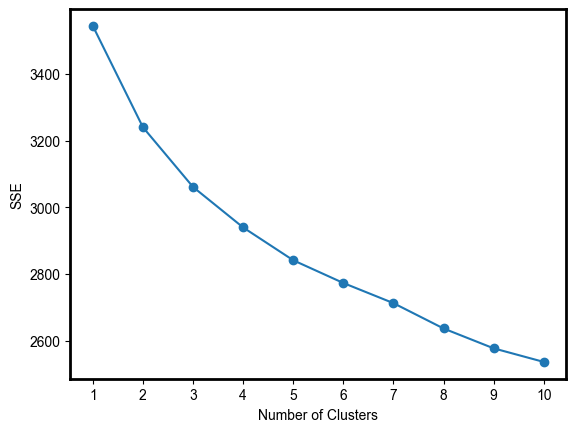

<Figure size 640x480 with 0 Axes>

In [107]:
from sklearn.cluster import KMeans
cluster_data = Z500_event_center_31_kmeans.copy()
cluster_data_normalized = (cluster_data - np.min(cluster_data))/(np.max(cluster_data) - np.min(cluster_data))
print(cluster_data_normalized.shape)
data_1 = cluster_data_normalized
sse = [] #Sum of Squared Errors
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, n_init =9, random_state = 42, init = 'k-means++')
    kmeans.fit(data_1)
    sse.append(kmeans.inertia_)
plt.plot(range(1,11), sse, marker = 'o')
plt.xticks(range(1,11))
plt.xlabel('Number of Clusters')
plt.ylabel('SSE')
plt.show()
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_sse.jpg',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_sse.pdf',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_sse.eps',dpi=300,bbox_inches='tight')

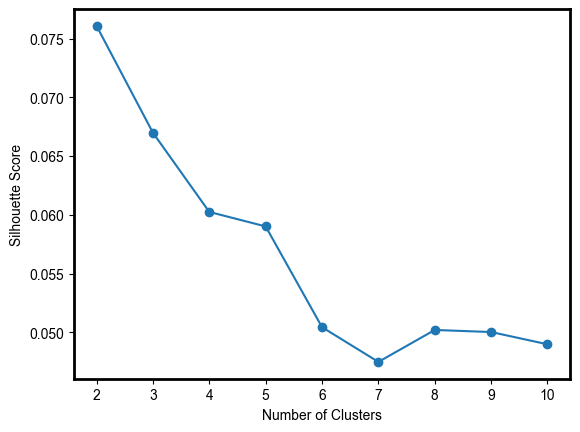

<Figure size 640x480 with 0 Axes>

In [108]:
from sklearn.metrics import silhouette_samples, silhouette_score

sihouette_score = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, n_init =9, random_state = 42, init = 'k-means++')
    kmeans.fit(data_1)
    sihouette_score.append(silhouette_score(data_1, kmeans.labels_))
plt.plot(range(2,11), sihouette_score, marker = 'o')
plt.xticks(range(2,11))
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_silhouette_score.jpg',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_silhouette_score.pdf',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_silhouette_score.eps',dpi=300,bbox_inches='tight')

# 4类

平均轮廓系数： 0.060250242812163464
样本轮廓系数： [ 0.08626142  0.01570665  0.02218759  0.06476789  0.06700279 -0.00103215
  0.03634362  0.01885643  0.02353648  0.0773345   0.09629466 -0.00807102
  0.00464622 -0.00079843  0.08163377  0.07714768  0.05511389  0.09642075
  0.08023044  0.11172246  0.00668832  0.07036849  0.10226134  0.02863231
  0.00105565  0.12668978  0.03505982  0.05174368  0.03685295  0.10702958
  0.09716531  0.01509337  0.01737967  0.11233867  0.01224047  0.0927595
  0.00494623  0.13770695  0.12618742  0.04194817  0.0399525   0.01909118
  0.0275831   0.06351682  0.05201479  0.01368007  0.03757575  0.05232236
  0.07431605  0.03079826  0.05388053  0.04894819  0.13134148  0.01606542
  0.07564554  0.0736332   0.09391701  0.13069084  0.11422203  0.04976245
  0.08746374  0.00422331  0.11645834  0.02084736  0.05523409  0.07494698
  0.13786032  0.05087462  0.07617482  0.03570069  0.19723502  0.06288948
  0.10777031  0.12738404 -0.00574843  0.13454672  0.05248154 -0.00170658
  0.00231829 -0

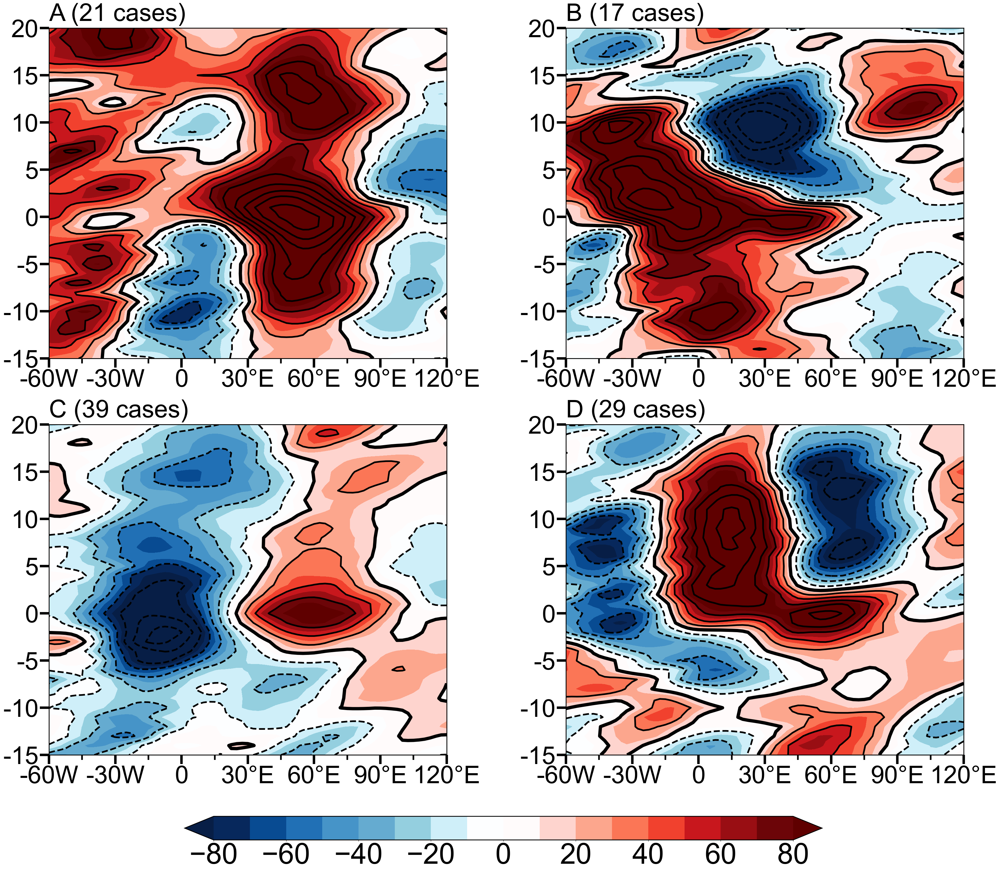

In [110]:
import openpyxl
kmeans_final = KMeans(n_clusters=4, n_init =9, random_state = 42, init = 'k-means++')
kmeans_final.fit(data_1)
print('平均轮廓系数：', silhouette_score(data_1, kmeans_final.labels_))
print('样本轮廓系数：', silhouette_samples(data_1, kmeans_final.labels_))
print('样本分类：', kmeans_final.labels_)
print('样本对应事件', np.arange(len(Z500_event_time_center))+1)
data = {
    '样本分类': kmeans_final.labels_,
    '样本对应事件':  np.arange(len(Z500_event_time_center))+1,
    '平均轮廓系数': silhouette_score(data_1, kmeans_final.labels_),  # 重复平均值以匹配行数
    '样本轮廓系数': silhouette_samples(data_1, kmeans_final.labels_)
}
df = pd.DataFrame(data)
# 保存到Excel文件
# df.to_excel('cluster_analysis_results_1.xlsx', index=False)
centers = kmeans_final.cluster_centers_
Z500_event_center_mean_all_remv=Z500_event_center_mean_all.copy()
kmeans.labels_=list(kmeans_final.labels_)
event_according=list(np.arange(len(Z500_event_time_center))+1)
for cla in np.where(silhouette_samples(data_1, kmeans.labels_)< 0.03)[0][::-1]:
    Z500_event_center_mean_all_remv.pop(cla)
    kmeans.labels_.pop(cla)
    event_according.pop(cla)
kmeans.labels_chr=[chr(ord('a')+kmeans.labels_[i]) for i in range(len(kmeans.labels_))]
event_filter=np.column_stack((event_according, kmeans.labels_chr))
kmeans.labels_=np.array(kmeans.labels_)
print(f'筛选后事件: {event_filter}')


cluster1_center ,cluster2_center,cluster3_center,cluster4_center= centers[0].reshape(26,49),centers[1].reshape(26,49),centers[2].reshape(26,49),centers[3].reshape(26,49)
cluster1_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==0)[0]],dim='time').values.reshape(-1,36,73).mean(0)
cluster2_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==1)[0]],dim='time').values.reshape(-1,36,73).mean(0)
cluster3_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==2)[0]],dim='time').values.reshape(-1,36,73).mean(0)
cluster4_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==3)[0]],dim='time').values.reshape(-1,36,73).mean(0)

fig = plt.figure(figsize=(40,32))
plt.subplots_adjust(wspace=0.3)
rcParams["axes.linewidth"] = 2
rcParams['font.family'] = 'Arial'

rcParams['hatch.linewidth'] = 3  # 控制点的线宽
rcParams['hatch.color'] = 'black'  # 修改图案颜色
temperature_cmap = cmaps.temp_19lev
# 获取该色图的颜色
colors = temperature_cmap(np.linspace(0, 1, temperature_cmap.N))

# 让中间两个颜色成为白色
midpoint = len(colors) // 2  # 找到色图的中间位置
colors[midpoint-1:midpoint+1] = np.array([1, 1, 1, 1])  # 设置中间的两个颜色为白色

# 创建新的色图
temperature_cmap = mcolors.LinearSegmentedColormap.from_list("custom_temp", colors)

ax = fig.add_subplot(2,2,1)
ax.set_title('A ('+str(np.where(kmeans.labels_==0)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap ,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)


ax = fig.add_subplot(2,2,2)
ax.set_title('B ('+str(np.where(kmeans.labels_==1)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)


ax = fig.add_subplot(2,2,3)
ax.set_title('C ('+str(np.where(kmeans.labels_==2)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)

ax = fig.add_subplot(2,2,4)
ax.set_title('D ('+str(np.where(kmeans.labels_==3)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster4_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster4_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster4_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster4_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)
cb_ax = fig.add_axes([0.24, 0.02, 0.54, 0.025])  # [左, 下, 宽, 高]
cb = fig.colorbar(c1, ax=ax,cax=cb_ax,orientation='horizontal', fraction=0.05, pad=0.1) #extendrect=True
cb.ax.tick_params(labelsize=70)
cb.set_ticks(np.arange(-80,81,20))
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_cluster_4.jpg',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_cluster_4.pdf',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_cluster_4.eps',dpi=300,bbox_inches='tight')

# 3类

平均轮廓系数： 0.06698791116321708
样本轮廓系数： [ 6.79235985e-02  6.14517511e-02  2.86234460e-02  9.90859663e-02
  7.42270878e-02  4.13836459e-02  7.11692001e-02  5.26382785e-02
  4.46860745e-02  1.24703590e-01  7.91195974e-02  3.08539411e-02
  4.37981425e-02  3.06835997e-02  6.99860704e-02  7.00955695e-02
  2.88129551e-02  1.40884630e-01  2.43480181e-03  2.27887704e-02
  3.78300351e-02  6.21674621e-02  6.33825337e-02  1.16783003e-01
  1.65933744e-02  1.11129493e-01 -2.31892951e-02  5.28142910e-02
  8.73032720e-02  1.18499243e-01  4.38304101e-02  5.08095225e-02
  2.88946243e-02  1.01373965e-01  1.96767951e-03  8.97035918e-02
 -1.24612078e-05  1.31905788e-01  1.25243921e-01  1.04905540e-01
  2.40559126e-02  2.85243277e-02  2.74665918e-02  7.63641911e-02
  4.22419623e-02  4.26466034e-03  3.29852087e-02  7.03885452e-02
  8.30026505e-02  2.95453432e-02  1.10858731e-01  1.34391845e-01
  1.12802192e-01  6.47568219e-02  3.91210743e-02  7.71497684e-02
  7.33583091e-02  1.08089971e-01  9.14084532e-02  7.26

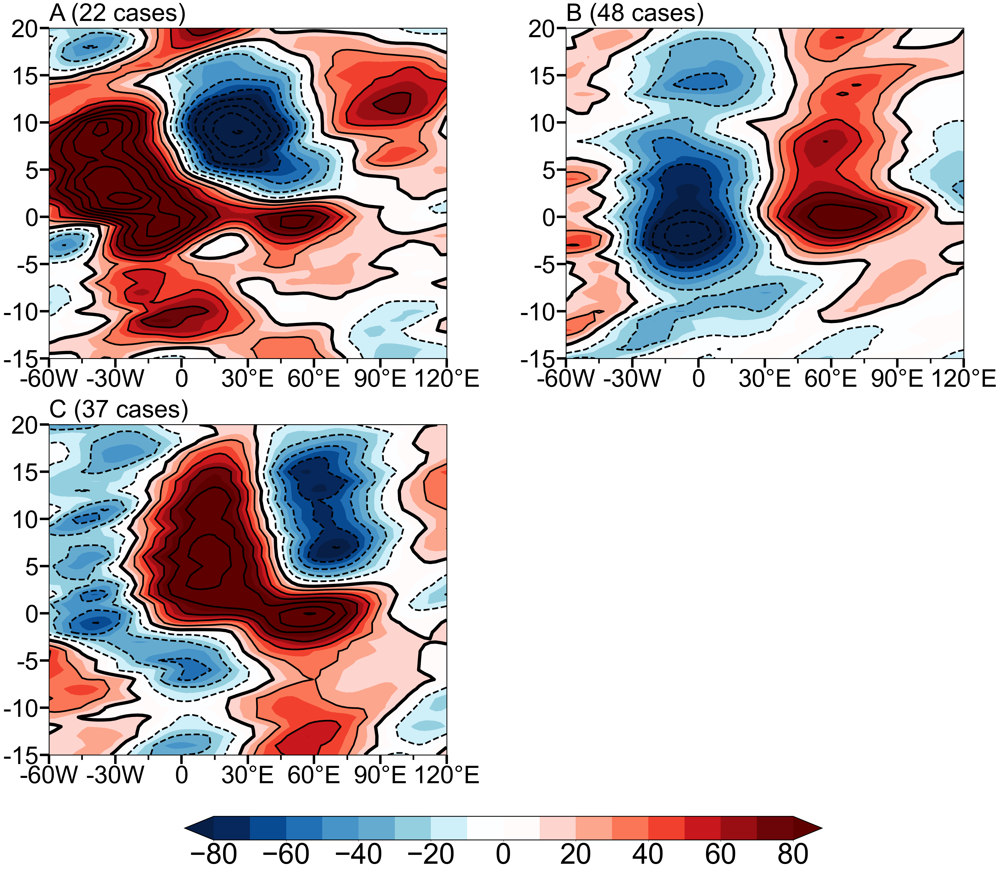

In [112]:
import openpyxl
kmeans_final = KMeans(n_clusters=3, n_init =9, random_state = 42, init = 'k-means++')
kmeans_final.fit(data_1)
print('平均轮廓系数：', silhouette_score(data_1, kmeans_final.labels_))
print('样本轮廓系数：', silhouette_samples(data_1, kmeans_final.labels_))
print('样本分类：', kmeans_final.labels_)
print('样本对应事件', np.arange(len(Z500_event_time_center))+1)
data = {
    '样本分类': kmeans_final.labels_,
    '样本对应事件':  np.arange(len(Z500_event_time_center))+1,
    '平均轮廓系数': silhouette_score(data_1, kmeans_final.labels_),  # 重复平均值以匹配行数
    '样本轮廓系数': silhouette_samples(data_1, kmeans_final.labels_)
}
df = pd.DataFrame(data)
# 保存到Excel文件
# df.to_excel('cluster_analysis_results_1.xlsx', index=False)
centers = kmeans_final.cluster_centers_

Z500_event_center_mean_all_remv=Z500_event_center_mean_all.copy()
kmeans.labels_=list(kmeans_final.labels_)
event_according=list(np.arange(len(Z500_event_time_center))+1)
for cla in np.where(silhouette_samples(data_1, kmeans.labels_)< 0.04)[0][::-1]:
    Z500_event_center_mean_all_remv.pop(cla)
    kmeans.labels_.pop(cla)
    event_according.pop(cla)
kmeans.labels_chr=[chr(ord('a')+kmeans.labels_[i]) for i in range(len(kmeans.labels_))]
event_filter=np.column_stack((event_according, kmeans.labels_chr))
kmeans.labels_=np.array(kmeans.labels_)
print(f'筛选后事件: {event_filter}')

cluster1_center ,cluster2_center,cluster3_center= centers[0].reshape(26,49),centers[1].reshape(26,49),centers[2].reshape(26,49)
cluster1_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==0)[0]],dim='time').values.reshape(-1,36,73).mean(0)
cluster2_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==1)[0]],dim='time').values.reshape(-1,36,73).mean(0)
cluster3_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==2)[0]],dim='time').values.reshape(-1,36,73).mean(0)

fig = plt.figure(figsize=(40,32))
plt.subplots_adjust(wspace=0.3)
rcParams["axes.linewidth"] = 2
rcParams['font.family'] = 'Arial'

rcParams['hatch.linewidth'] = 3  # 控制点的线宽
rcParams['hatch.color'] = 'black'  # 修改图案颜色
temperature_cmap = cmaps.temp_19lev
# 获取该色图的颜色
colors = temperature_cmap(np.linspace(0, 1, temperature_cmap.N))

# 让中间两个颜色成为白色
midpoint = len(colors) // 2  # 找到色图的中间位置
colors[midpoint-1:midpoint+1] = np.array([1, 1, 1, 1])  # 设置中间的两个颜色为白色

# 创建新的色图
temperature_cmap = mcolors.LinearSegmentedColormap.from_list("custom_temp", colors)

ax = fig.add_subplot(2,2,1)
ax.set_title('A ('+str(np.where(kmeans.labels_==0)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap ,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)


ax = fig.add_subplot(2,2,2)
ax.set_title('B ('+str(np.where(kmeans.labels_==1)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)


ax = fig.add_subplot(2,2,3)
ax.set_title('C ('+str(np.where(kmeans.labels_==2)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)
cb_ax = fig.add_axes([0.24, 0.02, 0.54, 0.025])  # [左, 下, 宽, 高]
cb = fig.colorbar(c1, ax=ax,cax=cb_ax,orientation='horizontal', fraction=0.05, pad=0.1) #extendrect=True
cb.ax.tick_params(labelsize=70)
cb.set_ticks(np.arange(-80,81,20))
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_cluster_3.jpg',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_cluster_3.pdf',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_cluster_3.eps',dpi=300,bbox_inches='tight')

# 5类

平均轮廓系数： 0.05901720087262459
样本轮廓系数： [ 0.07466042  0.01080012  0.03048975  0.06840152  0.02455289  0.03413754
  0.02260049  0.02768749  0.08762427  0.09933172  0.13202879  0.05292359
  0.03055078  0.10064471  0.04265896  0.07894276  0.10020922  0.04789351
  0.07548328  0.08624083  0.07463317  0.07772335  0.08263848  0.05335014
  0.0282015   0.14880319 -0.00782343  0.02542027  0.08407648  0.0852149
  0.09267649  0.09653796  0.03014382  0.0848748   0.03994026  0.09710974
  0.04308917  0.15468728  0.137995    0.08290494  0.01057365  0.00037187
  0.0081724   0.08512643  0.07328981  0.03182909  0.08432899  0.04209705
  0.05159522  0.05437328  0.08659087  0.08244588  0.11866354  0.03699041
  0.00728232  0.04402333  0.1235697   0.15000499  0.05035598  0.03568093
  0.07491025  0.01181394  0.05243797  0.02057944  0.05807099  0.07117957
  0.10670571  0.08054795  0.03324641  0.02141921  0.15707247  0.00685742
  0.02210918  0.0262296   0.06369524  0.11772822  0.06280448  0.05630169
  0.04701344 -0.

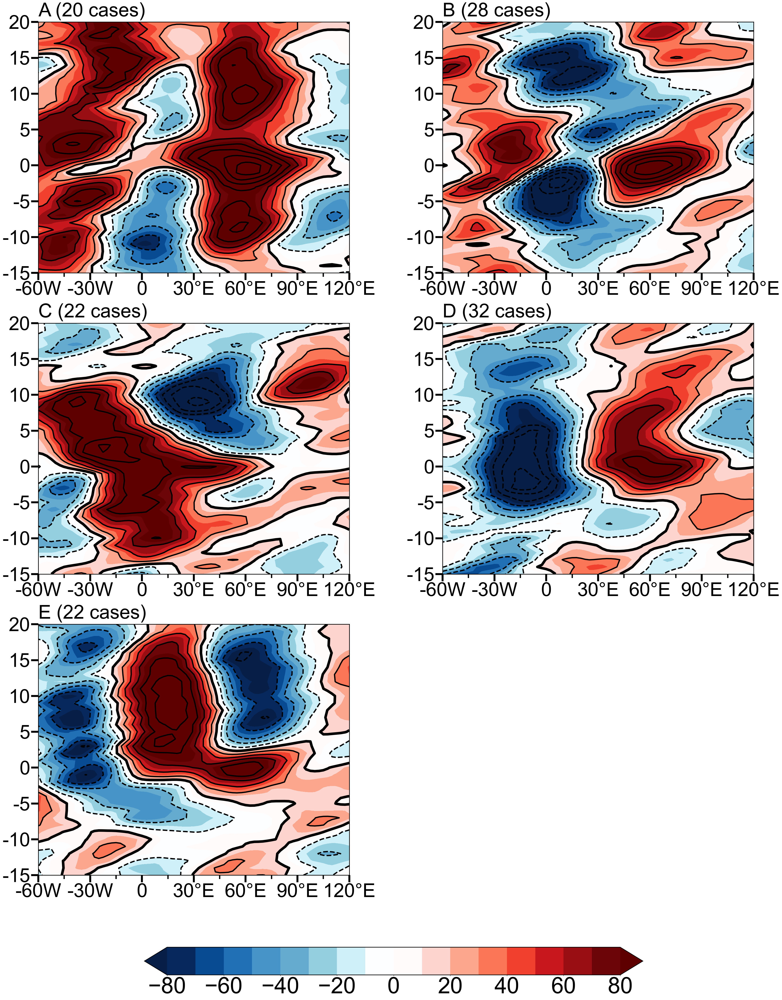

In [113]:
import openpyxl
kmeans_final = KMeans(n_clusters=5, n_init =9, random_state = 42, init = 'k-means++')
kmeans_final.fit(data_1)
print('平均轮廓系数：', silhouette_score(data_1, kmeans_final.labels_))
print('样本轮廓系数：', silhouette_samples(data_1, kmeans_final.labels_))
print('样本分类：', kmeans_final.labels_)
print('样本对应事件', np.arange(len(Z500_event_time_center))+1)
data = {
    '样本分类': kmeans_final.labels_,
    '样本对应事件':  np.arange(len(Z500_event_time_center))+1,
    '平均轮廓系数': silhouette_score(data_1, kmeans_final.labels_),  # 重复平均值以匹配行数
    '样本轮廓系数': silhouette_samples(data_1, kmeans_final.labels_)
}
df = pd.DataFrame(data)
# 保存到Excel文件
# df.to_excel('cluster_analysis_results_1.xlsx', index=False)
centers = kmeans_final.cluster_centers_

Z500_event_center_mean_all_remv=Z500_event_center_mean_all.copy()
kmeans.labels_=list(kmeans_final.labels_)
event_according=list(np.arange(len(Z500_event_time_center))+1)
for cla in np.where(silhouette_samples(data_1, kmeans.labels_)< 0.01)[0][::-1]:
    Z500_event_center_mean_all_remv.pop(cla)
    kmeans.labels_.pop(cla)
    event_according.pop(cla)
kmeans.labels_chr=[chr(ord('a')+kmeans.labels_[i]) for i in range(len(kmeans.labels_))]
event_filter=np.column_stack((event_according, kmeans.labels_chr))
kmeans.labels_=np.array(kmeans.labels_)
print(f'筛选后事件: {event_filter}')

cluster1_center ,cluster2_center,cluster3_center,cluster4_center,cluster5_center= centers[0].reshape(26,49),centers[1].reshape(26,49),centers[2].reshape(26,49),centers[3].reshape(26,49),centers[4].reshape(26,49)
cluster1_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==0)[0]],dim='time').values.reshape(-1,36,73).mean(0)
cluster2_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==1)[0]],dim='time').values.reshape(-1,36,73).mean(0)
cluster3_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==2)[0]],dim='time').values.reshape(-1,36,73).mean(0)
cluster4_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==3)[0]],dim='time').values.reshape(-1,36,73).mean(0)
cluster5_events = xr.concat([Z500_event_center_mean_all_remv[cla] for cla in np.where(kmeans.labels_==4)[0]],dim='time').values.reshape(-1,36,73).mean(0)


fig = plt.figure(figsize=(40,48))
plt.subplots_adjust(wspace=0.3)
rcParams["axes.linewidth"] = 2
rcParams['font.family'] = 'Arial'

rcParams['hatch.linewidth'] = 3  # 控制点的线宽
rcParams['hatch.color'] = 'black'  # 修改图案颜色
temperature_cmap = cmaps.temp_19lev
# 获取该色图的颜色
colors = temperature_cmap(np.linspace(0, 1, temperature_cmap.N))

# 让中间两个颜色成为白色
midpoint = len(colors) // 2  # 找到色图的中间位置
colors[midpoint-1:midpoint+1] = np.array([1, 1, 1, 1])  # 设置中间的两个颜色为白色

# 创建新的色图
temperature_cmap = mcolors.LinearSegmentedColormap.from_list("custom_temp", colors)

ax = fig.add_subplot(3,2,1)
ax.set_title('A ('+str(np.where(kmeans.labels_==0)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap ,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster1_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)


ax = fig.add_subplot(3,2,2)
ax.set_title('B ('+str(np.where(kmeans.labels_==1)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster2_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)


ax = fig.add_subplot(3,2,3)
ax.set_title('C ('+str(np.where(kmeans.labels_==2)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster3_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)

ax = fig.add_subplot(3,2,4)
ax.set_title('D ('+str(np.where(kmeans.labels_==3)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster4_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster4_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster4_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster4_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)

ax = fig.add_subplot(3,2,5)
ax.set_title('E ('+str(np.where(kmeans.labels_==2)[0].shape[0])+' cases)',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,np.arange(1,37), cluster5_events, zorder=0,levels =np.arange(-80,81,10) ,
                              cmap=temperature_cmap,extend='both')
C2 = ax.contour(lon,np.arange(1,37), cluster5_events, zorder=0,levels =np.arange(10,301,20),linestyles='-',colors='black',linewidths=4)
C2 = ax.contour(lon,np.arange(1,37), cluster5_events, zorder=0,levels =np.arange(-290,0,20),linestyles='--',colors='black',linewidths=4)
C3 = ax.contour(lon,np.arange(1,37), cluster5_events, zorder=0,levels =np.arange(10,11,20),linestyles='-',colors='black',linewidths=8)
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
plt.xlim((-60, 120))
plt.ylim((1, 36))
ax.set_yticks([1,6,11,16,21,26,31,36])
ax.set_yticklabels(['-15', '-10', '-5','0','5', '10', '15', '20'],
                       font={'family': 'Arial', 'size': 60})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)

cb_ax = fig.add_axes([0.24, 0.02, 0.54, 0.025])  # [左, 下, 宽, 高]
cb = fig.colorbar(c1, ax=ax,cax=cb_ax,orientation='horizontal', fraction=0.05, pad=0.1) #extendrect=True
cb.ax.tick_params(labelsize=70)
cb.set_ticks(np.arange(-80,81,20))
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_cluster_5.jpg',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_cluster_5.pdf',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Ural_blocking_cluster_5.eps',dpi=300,bbox_inches='tight')

# 绘制1993 1994 年个例 Hovmöller diagram

In [114]:
Z500_event_time_center_all= xr.concat(Z500_event_time_center, dim='time')
Z500_event_time_center_all.sel(time=slice('1993-12-01','1995-02-28'))

<xarray.DataArray 'time' (time: 2)> Size: 16B
array(['1994-01-08T00:00:00.000000000', '1995-01-20T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 16B 1994-01-08 1995-01-20

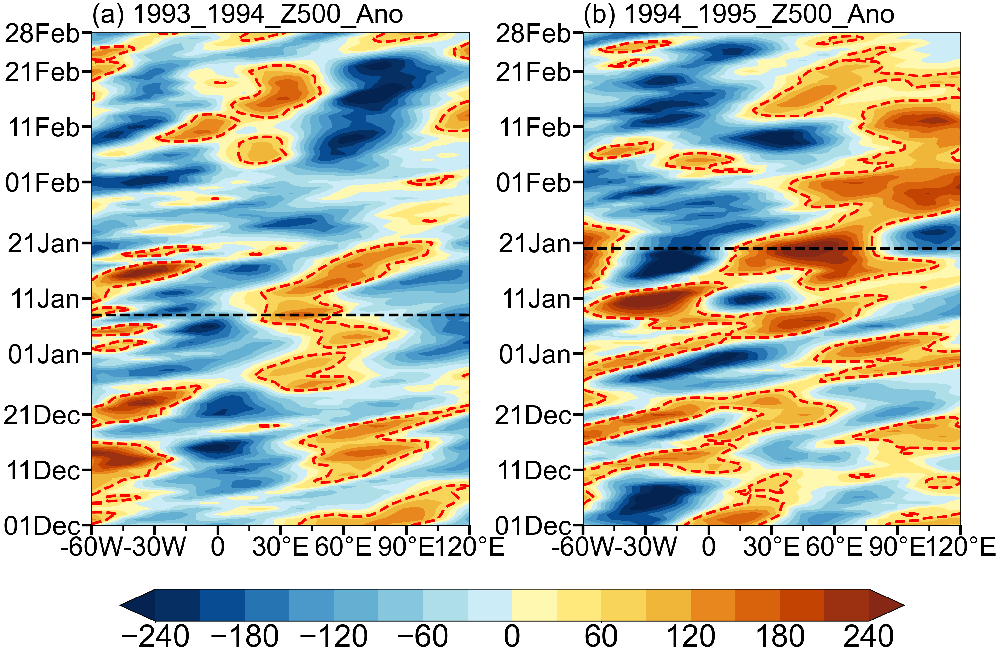

In [128]:
fig = plt.figure(figsize=(35,20))
plt.subplots_adjust(wspace=0.3)
rcParams["axes.linewidth"] = 2
rcParams['font.family'] = 'Arial'

rcParams['hatch.linewidth'] = 3  # 控制点的线宽
rcParams['hatch.color'] = 'black'  # 修改图案颜色

lon1=np.arange(-60,121,2.5)
ax = fig.add_subplot(1,2,1)
ax.set_title('(a) 1993_1994_Z500_Ano',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon1,np.arange(1,90+1), Z500_ano_mean.sel(time=slice('1993-12-01','1994-02-28')), zorder=0,levels =np.arange(-240,241,30) ,cmap=cmap,extend='both')
C2 = ax.contour(lon1,np.arange(1,90+1), Z500_ano_mean.sel(time=slice('1993-12-01','1994-02-28')), zorder=0,levels =np.arange(60,61,60),linestyles='--',colors='red',linewidths=6)
ax.axhline(39,ls='--',c='black',linewidth=6)
plt.xlim((-60, 120))
plt.ylim((1, 90))
ax.set_yticks([1,11,21,32,42,52,63,73,83,90])
ax.set_yticklabels(['01Dec','11Dec', '21Dec', '01Jan', '11Jan', '21Jan', '01Feb', '11Feb', '21Feb', '28Feb'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)

ax = fig.add_subplot(1,2,2)
ax.set_title('(b) 1994_1995_Z500_Ano',y=1.015,font={'family':'Arial','size':60},loc='left')
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon1,np.arange(1,90+1), Z500_ano_mean.sel(time=slice('1994-12-01','1995-02-28')), zorder=0,levels =np.arange(-240,241,30) ,cmap=cmap,extend='both')
C2 = ax.contour(lon1,np.arange(1,90+1), Z500_ano_mean.sel(time=slice('1994-12-01','1995-02-28')), zorder=0,levels =np.arange(60,61,60),linestyles='--',colors='red',linewidths=6)
ax.axhline(51,ls='--',c='black',linewidth=6)
plt.xlim((-60, 120))
plt.ylim((1, 90))
ax.set_yticks([1,11,21,32,42,52,63,73,83,90])
ax.set_yticklabels(['01Dec','11Dec', '21Dec', '01Jan', '11Jan', '21Jan', '01Feb', '11Feb', '21Feb', '28Feb'],
                       font={'family': 'Arial', 'size': 60})
ax.set_xticks(np.arange(-60,121,15))
ax.set_xticklabels(['-60W', '','-30W', '', '0','','30°E', '', '60°E','', '90°E','','120°E'],
                       font={'family': 'Arial', 'size': 60})
# ax.set_ylabel('Date', font={'family': 'Arial', 'size': 40})
ax.xaxis.set_major_locator(FixedLocator(np.arange(-60,121,30)))    
ax.xaxis.set_minor_locator(MultipleLocator(15))  
ax.tick_params(axis="x", which="major", direction="out", width=6, length=22,labelsize=60)
ax.tick_params(axis='x', which="minor", direction="out", width=4, length=12)
ax.tick_params(axis='y',  direction="out", width=6, length=22)
cb_ax = fig.add_axes([0.15, -0.04, 0.7, 0.05])  # [左, 下, 宽, 高]
cb = fig.colorbar(c1, ax=ax,cax=cb_ax,orientation='horizontal', fraction=0.05, pad=0.1) #extendrect=True
cb.ax.tick_params(labelsize=70)
cb.set_ticks(np.arange(-240,241,60))
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Event_1993_1994_5.jpg',dpi=300,bbox_inches='tight')

# 计算1979-2024年冬季daily 500hPa高度异常

In [ ]:
# time_all=pd.date_range('1979-12-01','2025-03-31',freq='D')
# time_all_summer=time_all[time_all.month.isin([12,1,2])]
# mask=(time_all_summer.month.isin([2])&time_all_summer.day.isin([29]))
# time_all_summer=time_all_summer[~mask]
# Z500_ano=xr.DataArray(data_cli_ano.values.reshape(46*90,37,145),coords=[time_all_summer,data_cli_ano.lat,data_cli_ano.lon],dims=['time','lat','lon'],name='Z500_ano')
# lon=np.arange(-60,150.1,2.5)
# lat=data_cli_ano.lat

In [ ]:
# for event_num in range(len(event)):
# # for event_num in range(1):
#     blocking_evnet1=Z500_ano.sel(time=event[event_num-1])
#     fig = plt.figure(figsize=(34,math.ceil(len(event[event_num-1])/4)*5))
#     for i in range(0,len(event[event_num-1]),1): 
#         ax = fig.add_subplot(math.ceil(len(event[event_num-1])/4),4,i+1,projection = ccrs.PlateCarree())
#         # ax.set_title('Z500&Z500 anom 26-30 Jan',font={'family':'Arial','size':30},loc='center')    #改改改
#         ax.set_title('(' + chr(ord('a') + i) + ') +' + str(i+1) + ' day',font={'family':'Arial','size':37},loc='left')
#         ax.add_feature(cfeature.COASTLINE.with_scale('50m')) 
#         ax.add_feature(cfeature.LAKES, alpha=0.5)
#         if i>len(event[event_num-1])-5:
#             ax.set_xticks(np.array([20,60,100,140,180]), crs=ccrs.PlateCarree())
#         if (i) % 4==0:
#             ax.set_yticks(np.array([20,40,60,80]), crs=ccrs.PlateCarree())
#         ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
#         ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
#         cs.draw_rectangle(30,90,45,70,ax)
#         # black_rectangle(1,60,21,50,ax)
#         import cmaps
#         cmap1=cmaps.BlueWhiteOrangeRed
#         cmap=cmaps.BlueYellowRed
#         c1 = ax.contourf(lon,lat, blocking_evnet1[i].sel(lon=slice(-60,150)), zorder=0,levels =np.arange(-240,241,30) ,
#                              transform=ccrs.PlateCarree(), cmap=cmap1,extend='both')
#         
#         ax.tick_params(axis='x', labelsize=30)
#         ax.tick_params(axis='y', labelsize=30)
#         ax.xaxis.set_major_locator(FixedLocator(np.arange(-50,151,50)))    
#         ax.xaxis.set_minor_locator(MultipleLocator(10))  
#         ax.yaxis.set_major_locator(FixedLocator(np.arange(0,90,20)))    
#         ax.yaxis.set_minor_locator(MultipleLocator(10)) 
#         ax.tick_params(axis="x", which="major", direction="out", width=4, length=16,labelsize=35)
#         ax.tick_params(axis='x', which="minor", direction="out", width=2, length=8)
#         ax.tick_params(axis="y", which="major", direction="out", width=4, length=16,labelsize=35)
#         ax.tick_params(axis='y', which="minor", direction="out", width=2, length=8)
#     position=fig.add_axes([0.93, 0.14,  0.015, 0.7])
#     cb = plt.colorbar(c1,cax=position,fraction=0.032, pad=0.2,orientation='vertical')
#     cb.ax.tick_params(labelsize=40)
#     cb.set_ticks(np.arange(-240,241,60))
#     cs.mkdir_directory(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Z500_daily')
#     plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Z500_daily\Z500_25_daily_event'+str(event_num)+'.jpg',dpi=300,bbox_inches='tight')
# # plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Z500_daily\Z500_25_daily_event'+str(event_num)+'.pdf',dpi=300,bbox_inches='tight')
# # plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Z500_daily\Z500_25_daily_event'+str(event_num)+'.eps',dpi=300,bbox_inches='tight')

# 绘制所有事件平均

In [16]:
time_all=pd.date_range('1979-12-01','2025-03-31',freq='D')
time_all_summer=time_all[time_all.month.isin([12,1,2])]
mask=(time_all_summer.month.isin([2])&time_all_summer.day.isin([29]))
time_all_summer=time_all_summer[~mask]
Z500_ano=xr.DataArray(data_cli_ano.values.reshape(46*90,37,145),coords=[time_all_summer,data_cli_ano.lat,data_cli_ano.lon],dims=['time','lat','lon'],name='Z500_ano')
Z500_ano_event=Z500_ano.loc[sum(event,[])]
Z500_ano_event_timean=Z500_ano_event.mean('time')
lon=np.arange(-60,150.1,2.5)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


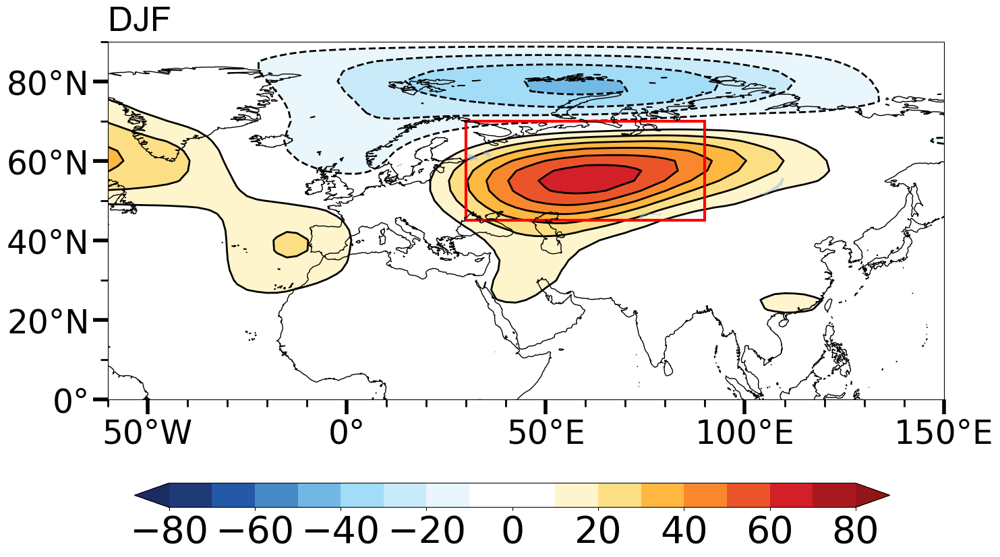

In [32]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(1,1,1,projection = ccrs.PlateCarree())
ax.set_title('DJF',y=1.015,font={'family':'Arial','size':37},loc='left')
ax.add_feature(cfeature.COASTLINE.with_scale('50m')) 
ax.add_feature(cfeature.LAKES, alpha=0.5)
ax.set_xticks(np.array([20,60,100,140,180]), crs=ccrs.PlateCarree())
ax.set_yticks(np.array([20,40,60,80]), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
cs.draw_rectangle(30,90,45,70,ax)
# black_rectangle(1,60,21,50,ax)
import cmaps
cmap1=cmaps.BlueWhiteOrangeRed
cmap=cmaps.BlueYellowRed
c1 = ax.contourf(lon,lat, Z500_ano_event_timean.sel(lon=slice(-60,150)), zorder=0,levels =np.arange(-80,81,10) ,
                     transform=ccrs.PlateCarree(), cmap=cmap1,extend='both')
C2 = ax.contour(lon,lat, Z500_ano_event_timean.sel(lon=slice(-60,150)), zorder=0,levels =np.arange(-160,0,10),linestyles='--',colors='black',linewidths=2)
C3 = ax.contour(lon,lat, Z500_ano_event_timean.sel(lon=slice(-60,150)), zorder=0,levels =np.arange(10,161,10),linestyles='-',colors='black',linewidths=2)

ax.tick_params(axis='x', labelsize=30)
ax.tick_params(axis='y', labelsize=30)
ax.xaxis.set_major_locator(FixedLocator(np.arange(-50,151,50)))    
ax.xaxis.set_minor_locator(MultipleLocator(10))  
ax.yaxis.set_major_locator(FixedLocator(np.arange(0,90,20)))    
ax.yaxis.set_minor_locator(MultipleLocator(10)) 
ax.tick_params(axis="x", which="major", direction="out", width=4, length=16,labelsize=35)
ax.tick_params(axis='x', which="minor", direction="out", width=2, length=8)
ax.tick_params(axis="y", which="major", direction="out", width=4, length=16,labelsize=35)
ax.tick_params(axis='y', which="minor", direction="out", width=2, length=8)
position=fig.add_axes([0.15, 0.14,  0.7, 0.03])
cb = plt.colorbar(c1,cax=position,fraction=0.032, pad=0.2,orientation='horizontal')
cb.ax.tick_params(labelsize=40)
cb.set_ticks(np.arange(-80,81,20))
cs.mkdir_directory(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Z500_event_all')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Z500_event_all\Z500_anomean.jpg',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Z500_event_all\Z500_anomean.pdf',dpi=300,bbox_inches='tight')
plt.savefig(r'D:\research\dissertation\Diversity of the blocking\Test_DJF\Z500_event_all\Z500_anomean.eps',dpi=300,bbox_inches='tight')